# Deep Learning 2025 - Project Assignment
## Few-Shot Adaptation of Vision-Language Models

**Authors:** Martin Astyan & Corby Antoine  
**Course:** Deep Learning 2025  
**Dataset:** Oxford Flowers-102  
**Objective:** Develop a few-shot adaptation method that improves performance on base categories while preserving zero-shot performance on novel categories.

---

## Table of Contents
1. Introduction and Problem Statement
2. Dataset Preparation and Analysis
3. CLIP Zero-Shot Baseline Evaluation
4. CoOp Implementation
5. CoCoOp Implementation
6. CoCoOp Meta-Net Enhancement
7. Conclusion and Future Work

---

## 1. Introduction and Problem Statement

### 1.1 Few-Shot Learning Challenge

Few-shot learning addresses the challenge of adapting machine learning models to new tasks with minimal training data. This is particularly relevant in scenarios where:
- Data collection is expensive or time-consuming
- Domain-specific knowledge is required
- Quick adaptation to new categories is essential

### 1.2 Vision-Language Models and CLIP

CLIP (Contrastive Language-Image Pre-training) represents a breakthrough in vision-language understanding by learning joint representations of images and text through contrastive learning. Its zero-shot capabilities allow classification without task-specific training by leveraging natural language descriptions.

### 1.3 Base-to-Novel Generalization Problem

**Challenge:** While fine-tuning CLIP on base categories can improve performance, it often leads to huge forgetting of novel categories.

**Goal:** Develop methods that:
- Improve accuracy on base categories (using few-shot data)
- Preserve or improve zero-shot performance on novel categories
- Achieve high harmonic mean between base and novel accuracies

### 1.4 Our Approach: CoOp and CoCoOp

We will first implement and compare two state-of-the-art methods:

1. **CoOp (Context Optimization):** Replaces hand-crafted prompts with learnable context vectors
2. **CoCoOp (Conditional Context Optimization):** Extends CoOp with image-conditional contexts to reduce overfitting

The final goal is to keep the basis of the CoCoOp method and then find a way to enhance it and get better results.

In [1]:
# Device setup
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
print(f"PyTorch version: {torch.__version__}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name()}")

# Standard library
import os
import random
from collections import Counter, OrderedDict

# Core libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import PIL

# Torch and torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torch.utils.tensorboard import SummaryWriter
import torchvision.transforms as transforms
from torchvision.datasets import Flowers102

# CLIP model
%pip install openai_clip
import clip

# Metrics and utilities
from sklearn.metrics import confusion_matrix, adjusted_rand_score, silhouette_score, silhouette_samples, pairwise_distances
from sklearn.cluster import KMeans
from tqdm import tqdm
import copy
import umap.umap_ as umap
import cv2

# Set random seeds for reproducibility
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

set_seed(42)

Using device: cuda
PyTorch version: 2.6.0+cu124
CUDA device: Tesla T4
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 58.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.3 MB/s eta 0:00:00
  Created wheel for openai_clip: filename=openai_clip-1.0.1-py3-none-any.whl size=1368605 sha256=a239cbfebc69bf25731a584c8ce4d545bd99970e78e94d6740f3721ef2b13bfd
  Stored in directory: /root/.cache/pip/wheels/0d/17/90/042948fd2e2a87f1dcf6db6d438cad015c49db0c53d1d9c7dc
Successfully built openai_clip


---

## 2. Dataset Preparation and Analysis

### 2.1 Oxford Flowers-102 Dataset

The Oxford Flowers-102 dataset consists of 102 flower categories commonly found in the UK.

**Dataset Statistics:**
- **Classes:** 102 flower categories
- **Training shots per class:** 10 ($k=10$)
- **Base classes:** 51 (first half)
- **Novel classes:** 51 (second half)

In [2]:
def get_data(data_dir="./data", transform=None):
    """Load Flowers102 dataset splits with optional transforms."""
    train = Flowers102(root=data_dir, split="train", download=True, transform=transform)
    val = Flowers102(root=data_dir, split="val", download=True, transform=transform)
    test = Flowers102(root=data_dir, split="test", download=True, transform=transform)
    return train, val, test

def base_novel_categories(dataset):
    """Split dataset classes into base and novel categories for few-shot evaluation."""
    all_classes = set(dataset._labels)
    num_classes = len(all_classes)

    # Split classes: first half = base, second half = novel
    base_classes = list(range(num_classes))[:num_classes//2]
    novel_classes = list(range(num_classes))[num_classes//2:]

    return base_classes, novel_classes

# Initialize dataset analysis
_, _, tmp_test = get_data()
base_classes, novel_classes = base_novel_categories(tmp_test)

# Oxford Flowers-102 class names
CLASS_NAMES = ["pink primrose", "hard-leaved pocket orchid", "canterbury bells", "sweet pea", "english marigold", "tiger lily", "moon orchid", "bird of paradise", "monkshood", "globe thistle", "snapdragon", "colt's foot", "king protea", "spear thistle", "yellow iris", "globe-flower", "purple coneflower", "peruvian lily", "balloon flower", "giant white arum lily", "fire lily", "pincushion flower", "fritillary", "red ginger", "grape hyacinth", "corn poppy", "prince of wales feathers", "stemless gentian", "artichoke", "sweet william", "carnation", "garden phlox", "love in the mist", "mexican aster", "alpine sea holly", "ruby-lipped cattleya", "cape flower", "great masterwort", "siam tulip", "lenten rose", "barbeton daisy", "daffodil", "sword lily", "poinsettia", "bolero deep blue", "wallflower", "marigold", "buttercup", "oxeye daisy", "common dandelion", "petunia", "wild pansy", "primula", "sunflower", "pelargonium", "bishop of llandaff", "gaura", "geranium", "orange dahlia", "pink-yellow dahlia?", "cautleya spicata", "japanese anemone", "black-eyed susan", "silverbush", "californian poppy", "osteospermum", "spring crocus", "bearded iris", "windflower", "tree poppy", "gazania", "azalea", "water lily", "rose", "thorn apple", "morning glory", "passion flower", "lotus", "toad lily", "anthurium", "frangipani", "clematis", "hibiscus", "columbine", "desert-rose", "tree mallow", "magnolia", "cyclamen", "watercress", "canna lily", "hippeastrum", "bee balm", "ball moss", "foxglove", "bougainvillea", "camellia", "mallow", "mexican petunia", "bromelia", "blanket flower", "trumpet creeper", "blackberry lily"]

print("- Dataset Analysis")
print("=" * 50)
print(f"Total classes: {len(CLASS_NAMES)}")
print(f"Base classes: {len(base_classes)} (indices 0-{len(base_classes)-1})")
print(f"Novel classes: {len(novel_classes)} (indices {len(base_classes)}-{len(base_classes)+len(novel_classes)-1})")
print()
print("- Base Class Examples:", [(i, CLASS_NAMES[i]) for i in base_classes[:5]] + ["..."])
print("- Novel Class Examples:", [(i, CLASS_NAMES[i]) for i in novel_classes[:5]] + ["..."])

100%|██████████| 345M/345M [00:21<00:00, 16.2MB/s]
100%|██████████| 502/502 [00:00<00:00, 1.77MB/s]
100%|██████████| 15.0k/15.0k [00:00<00:00, 21.8MB/s]

- Dataset Analysis
Total classes: 102
Base classes: 51 (indices 0-50)
Novel classes: 51 (indices 51-101)

- Base Class Examples: [(0, 'pink primrose'), (1, 'hard-leaved pocket orchid'), (2, 'canterbury bells'), (3, 'sweet pea'), (4, 'english marigold'), '...']
- Novel Class Examples: [(51, 'wild pansy'), (52, 'primula'), (53, 'sunflower'), (54, 'pelargonium'), (55, 'bishop of llandaff'), '...']


### 2.2 Dataset Visualization and Statistical Analysis

We can here analyze class distributions, visual diversity, and prevent potential challenges that may affect model performance.


- Training Set Class Distribution
 Index                Class Name  Count
     0             pink primrose     10
     1 hard-leaved pocket orchid     10
     2          canterbury bells     10
     3                 sweet pea     10
     4          english marigold     10
     5                tiger lily     10
     6               moon orchid     10
     7          bird of paradise     10
     8                 monkshood     10
     9             globe thistle     10
    10                snapdragon     10
    11               colt's foot     10
    12               king protea     10
    13             spear thistle     10
    14               yellow iris     10
    15              globe-flower     10
    16         purple coneflower     10
    17             peruvian lily     10
    18            balloon flower     10
    19     giant white arum lily     10
    20                 fire lily     10
    21         pincushion flower     10
    22                fritillary     10
    2

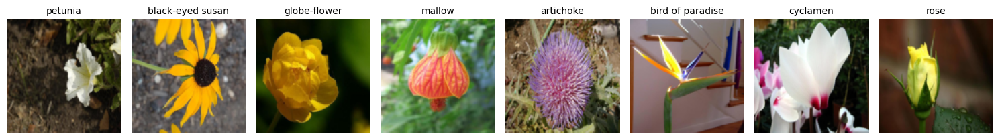


- Random Sample Analysis:
   Sample 1 (idx 654): Class 65 = 'osteospermum'
   Sample 2 (idx 114): Class 11 = 'colt's foot'
   Sample 3 (idx 25): Class 2 = 'canterbury bells'
   Sample 4 (idx 759): Class 75 = 'morning glory'
   Sample 5 (idx 281): Class 28 = 'artichoke'


In [3]:
def show_samples(dataset, class_names, n=8):
    """Display random samples for dataset exploration and verification."""
    loader = DataLoader(dataset, batch_size=n, shuffle=True)
    data_iter = iter(loader)
    images, labels = next(data_iter)

    # Handle different image formats
    if isinstance(images[0], PIL.Image.Image):
        images = [transforms.ToTensor()(img) for img in images]
        images = torch.stack(images)

    plt.figure(figsize=(15, 5))
    for i in range(n):
        img = images[i].permute(1, 2, 0)
        plt.subplot(1, n, i + 1)
        plt.imshow(img)
        plt.title(class_names[labels[i]], fontsize=10)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def show_class_distribution_table(dataset, class_names=CLASS_NAMES):
    """Analyze and display class distribution statistics."""
    class_counts = Counter(dataset._labels)

    data = [
        {"Index": idx, "Class Name": class_names[idx], "Count": count}
        for idx, count in sorted(class_counts.items())
    ]

    df = pd.DataFrame(data)
    print(df.to_string(index=False))

    # Statistical summary
    counts = list(class_counts.values())
    print(f"\n- Distribution Summary:")
    print(f"   Mean samples per class: {np.mean(counts):.1f}")
    print(f"   Standard deviation: {np.std(counts):.1f}")
    print(f"   Min samples: {min(counts)}")
    print(f"   Max samples: {max(counts)}")

def explore_text_labels(dataset, n=5):
    """Verify dataset labeling and explore sample characteristics."""
    indices = random.sample(range(len(dataset)), n)
    print("- Random Sample Analysis:")
    for i, idx in enumerate(indices):
        image, label = dataset[idx]
        print(f"   Sample {i+1} (idx {idx}): Class {label} = '{CLASS_NAMES[label]}'")

# Dataset analysis with basic transforms
basic_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

train_set, val_set, test_set = get_data(transform=basic_transform)

print("\n- Training Set Class Distribution")
print("=" * 50)
show_class_distribution_table(train_set)
print("\n- Sample Images from Training Set")
print("=" * 50)
show_samples(train_set, CLASS_NAMES, n=8)
print("\n" + "="*50)
explore_text_labels(train_set, n=5)

### 2.3 Data Splitting Strategy

We implement a systematic approach that ensures:

- **Clean separation**: Base and novel classes are completely disjoint
- **Balanced evaluation**: Equal number of base and novel classes

To follow the assignement's requirements, we are using :
- **Subset isolation**: Separate datasets for base and novel categories
- **Evaluation protocol**: Novel classes never seen during training

In [4]:
class MappedDataset(Dataset):
    """Dataset wrapper that remaps labels to contiguous indices for efficiency."""

    def __init__(self, dataset, label_mapping):
        self.dataset = dataset
        self.label_mapping = label_mapping

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image, label = self.dataset[idx]
        mapped_label = self.label_mapping[label]
        return image, mapped_label

def split_data(dataset, base_classes):
    """Create base and novel subsets with proper label mapping."""
    base_samples = []
    novel_samples = []

    base_set = set(base_classes)
    novel_classes = [i for i in range(len(CLASS_NAMES)) if i not in base_set]

    # Categorize samples by base/novel status
    for sample_id, label in enumerate(dataset._labels):
        if label in base_set:
            base_samples.append(sample_id)
        else:
            novel_samples.append(sample_id)

    # Create subsets
    base_subset = torch.utils.data.Subset(dataset, base_samples)
    novel_subset = torch.utils.data.Subset(dataset, novel_samples)

    # Create label mappings for contiguous indexing
    base_label_mapping = {old_label: new_label for new_label, old_label in enumerate(base_classes)}
    novel_label_mapping = {old_label: new_label for new_label, old_label in enumerate(novel_classes)}

    # Wrap with mapped datasets
    base_dataset = MappedDataset(base_subset, base_label_mapping)
    novel_dataset = MappedDataset(novel_subset, novel_label_mapping)

    return base_dataset, novel_dataset

---

## 3. CLIP Zero-Shot Baseline Evaluation

### 3.1 CLIP Zero-Shot Mechanism

We use the template "a photo of a [CLASS], a type of flower" to provide context that helps
CLIP understand we're dealing with flower classification rather than general object recognition.

This baseline establishes the zero-shot performance ceiling that our few-shot methods
should ideally maintain on novel classes.

In [5]:
# Load CLIP model with ViT-B/32 architecture
model, preprocess = clip.load("ViT-B/16", device=device)

print("- CLIP Model Loaded Successfully")
print(f"   Model: ViT-B/16")
print(f"   Input resolution: {preprocess.transforms[0].size}")
print("   Preprocessing pipeline:")
for i, transform in enumerate(preprocess.transforms):
    print(f"      {i+1}. {transform}")

100%|███████████████████████████████████████| 335M/335M [00:06<00:00, 51.5MiB/s]


- CLIP Model Loaded Successfully
   Model: ViT-B/16
   Input resolution: 224
   Preprocessing pipeline:
      1. Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
      2. CenterCrop(size=(224, 224))
      3. <function _convert_image_to_rgb at 0x7a06fe859ee0>
      4. ToTensor()
      5. Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))


### 3.2 Dataset Preparation with Preprocessing

CLIP requires specific preprocessing that matches its training distribution. The preprocessing pipeline ensures that input images are in the same format that CLIP was trained on.

In [6]:
# Load datasets with CLIP's preprocessing pipeline
train_set, val_set, test_set = get_data(transform=preprocess)

# Split classes into base and novel categories
base_classes, novel_classes = base_novel_categories(train_set)

# Create dataset splits
train_base, _ = split_data(train_set, base_classes)  # Only base classes for training
val_base, _ = split_data(val_set, base_classes)      # Only base classes for validation
test_base, test_novel = split_data(test_set, base_classes)  # Separate base/novel for testing

print("Dataset Splits Created")
print("=" * 40)
print(f"Training (base only):     {len(train_base):4d} samples")
print(f"Validation (base only):   {len(val_base):4d} samples")
print(f"Test base:                {len(test_base):4d} samples")
print(f"Test novel:               {len(test_novel):4d} samples")

Dataset Splits Created
Training (base only):      510 samples
Validation (base only):    510 samples
Test base:                2473 samples
Test novel:               3676 samples


### 3.3 Zero-Shot Evaluation Implementation

The evaluation framework implements standard few-shot learning metrics with emphasis on  the base-novel trade-off.
**Harmonic Mean** encourages balanced solutions that work well on both base and novel classes.

In [7]:
def harmonic_mean(base_accuracy, novel_accuracy):
    """Calculate harmonic mean"""
    if base_accuracy == 0 or novel_accuracy == 0:
        return 0.0
    return 2 / (1 / base_accuracy + 1 / novel_accuracy)

In [8]:
@torch.no_grad()
def evaluate_zero_shot(clip_model, dataset, class_indices, class_names,
                      batch_size=64, device="cuda", label=""):
    """Evaluate CLIP zero-shot performance on given dataset and classes."""
    clip_model.eval()

    # Create text prompts with domain-specific context
    prompts = [f"a photo of a {class_names[idx]}, a type of flower." for idx in class_indices]
    text_tokens = clip.tokenize(prompts).to(device)

    # Encode text features
    text_features = clip_model.encode_text(text_tokens)
    text_features = text_features / text_features.norm(dim=-1, keepdim=True)

    # Evaluate on images
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)
    correct = 0
    total = 0

    for images, labels in tqdm(dataloader, desc=f"- {label}"):
        images = images.to(device)
        labels = labels.to(device)

        # Encode image features
        image_features = clip_model.encode_image(images)
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)

        # Compute similarities and predictions
        similarity = image_features @ text_features.T
        preds = similarity.argmax(dim=1)

        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return 100.0 * correct / total

---

## 4. CoOp Implementation

### 4.1 CoOp: Context Optimization Overview

**Core Idea:** Replace hand-crafted text prompts (like "a photo of a [CLASS]") with learnable context vectors that are optimized using few-shot training data. A lot of parameters or implementations choices are based on this paper : [Conditional Prompt Learning for Vision-Language Models](https://arxiv.org/abs/2203.05557) [1]. In addition, we tried to develop another system less complex than the one from the Github project of this paper but unfortunately it didn't reach our expectations. Therefore, we chose to rely on their modular implementation of the solution with a PromptLearner, a TextEncoder and the CoOp class.

**Architecture:**
- **Input:** Images + Learnable context vectors + Class names
- **Learnable Parameters:** M context vectors (we use $M=16$ for better results according to [1])
- **Prompt structure:** [$CTX_1$] [$CTX_2$] [...] [$CTX_{16}$] [CLASS] where CTX are learnable (Class at the end of the sentence because [1] showed that the mid or end positions reach almost equal results)
- **Non CSC Tokens:** [1] has shown that the Class Specific Context Tokens are way less effective
- **Frozen Parameters:** Entire CLIP backbone (vision + text encoders)
- **Training:** Only optimize context vectors using cross-entropy loss

**Benefits:**
- Automatic prompt optimization (no manual prompt engineering)
- Parameter-efficient (only ~2K parameters vs 50M+ in CLIP)
- Leverages pre-trained knowledge while adapting to specific domains

**Expected Behavior:**
- Improved accuracy on base classes
- Potential degradation on novel classes (overfitting issue)

In [9]:
class TextEncoder(nn.Module):
    """Text encoder that extracts features from learnable prompts"""
    def __init__(self, clip_model):
        super().__init__()
        self.transformer = clip_model.transformer
        self.positional_embedding = clip_model.positional_embedding
        self.ln_final = clip_model.ln_final
        self.text_projection = clip_model.text_projection
        self.dtype = clip_model.dtype

    def forward(self, prompts, tokenized_prompts):
        x = prompts + self.positional_embedding.type(self.dtype)
        x = x.permute(1, 0, 2)  # NLD -> LND
        x = self.transformer(x)
        x = x.permute(1, 0, 2)  # LND -> NLD
        x = self.ln_final(x).type(self.dtype)

        # Extract features from the end-of-text token
        x = x[torch.arange(x.shape[0], device=device), tokenized_prompts.argmax(dim=-1)] @ self.text_projection
        return x

In [10]:
class PromptLearner(nn.Module):
    """Learnable prompt generator for CoOp"""
    def __init__(self, classnames, clip_model, n_ctx=4, ctx_init="", noise_scale=None):
        super().__init__()
        self.noise_scale = noise_scale
        n_cls = len(classnames)
        dtype = clip_model.dtype
        ctx_dim = clip_model.ln_final.weight.shape[0]

        # Initialize context vectors
        if ctx_init:
            # Use given words to initialize context vectors
            ctx_init = ctx_init.replace("_", " ")
            n_ctx = len(ctx_init.split(" "))
            prompt = clip.tokenize(ctx_init).to(device)
            with torch.no_grad():
                embedding = clip_model.token_embedding(prompt).type(dtype)
            ctx_vectors = embedding[0, 1:1 + n_ctx, :]
            prompt_prefix = ctx_init
        else:
            # Random initialization
            ctx_vectors = torch.empty(n_ctx, ctx_dim, dtype=dtype)
            nn.init.normal_(ctx_vectors, std=0.02)
            prompt_prefix = " ".join(["X"] * n_ctx)

        print(f'Initial context: "{prompt_prefix}"')
        print(f"Number of context words: {n_ctx}")

        self.ctx = nn.Parameter(ctx_vectors)  # Learnable parameters

        # Prepare class names and prompts
        classnames = [name.replace("_", " ") for name in classnames]
        prompts = [prompt_prefix + " " + name + "." for name in classnames]

        tokenized_prompts = torch.cat([clip.tokenize(p).to(device) for p in prompts])
        with torch.no_grad():
            embedding = clip_model.token_embedding(tokenized_prompts).type(dtype)

        # Store token vectors (prefix and suffix)
        self.register_buffer("token_prefix", embedding[:, :1, :])  # SOS
        self.register_buffer("token_suffix", embedding[:, 1 + n_ctx:, :])  # CLS, EOS

        self.n_cls = n_cls
        self.n_ctx = n_ctx
        self.tokenized_prompts = tokenized_prompts
        self.classnames = classnames

    def forward(self):
        ctx = self.ctx
        if ctx.dim() == 2:
            ctx = ctx.unsqueeze(0).expand(self.n_cls, -1, -1)

        if self.training and self.noise_scale:
            # 1. Get the maximum value of the tokens
            max_val = ctx.abs().max().item()

            # 2. Noise scale based on the max value (noise_scale %)
            std = self.noise_scale * max_val

            # 3. Noise generation
            noise = torch.randn_like(ctx) * std

            # 4. Adding to the context
            ctx = ctx + noise

        prefix = self.token_prefix
        suffix = self.token_suffix

        # Construct prompts: [SOS] [CTX] [CLS] [EOS]
        prompts = torch.cat([prefix, ctx, suffix], dim=1)
        return prompts

In [11]:
class CoOp(nn.Module):
    """Complete CoOp model combining image encoder, prompt learner, and text encoder"""
    def __init__(self, classnames, clip_model, n_ctx=16, ctx_init="", noise_scale=0.15):
        super().__init__()
        self.prompt_learner = PromptLearner(classnames, clip_model, n_ctx, ctx_init, noise_scale)
        self.tokenized_prompts = self.prompt_learner.tokenized_prompts
        self.image_encoder = clip_model.visual
        self.text_encoder = TextEncoder(clip_model)
        self.logit_scale = clip_model.logit_scale
        self.dtype = clip_model.dtype

    def forward(self, image):
        # Encode image
        image_features = self.image_encoder(image.type(self.dtype))

        # Generate learnable prompts and encode text
        prompts = self.prompt_learner()
        text_features = self.text_encoder(prompts, self.tokenized_prompts)

        # Normalize features
        image_features = F.normalize(image_features, dim=-1)
        text_features = F.normalize(text_features, dim=-1)

        # Compute similarity scores
        logit_scale = self.logit_scale.exp()
        logits = logit_scale * image_features @ text_features.t()

        return logits

### 4.2 Training Infrastructure
The training infrastructure provides a unified framework for both CoOp and CoCoOp models. The key design principles include:

1. **Parameter-Efficient Training**: Only update learnable context vectors and Meta-Net (for CoCoOp)
2. **Stable Optimization**: Use SGD optimizer with cosine annealing learning rate schedule
3. **Memory Management**: Implement efficient batch processing and garbage collection for large models
4. **Progress Monitoring**: Track training loss and validation accuracy with early stopping

The training process follows these steps:
- Initialize optimizers for the specific trainable parameters
- Implement cross-entropy loss for classification
- Use cosine annealing for learning rate scheduling
- Save best model based on validation accuracy
- Provide detailed progress tracking and visualization

In [12]:
def train_epoch(model, train_loader, optimizer, device, epoch):
    """Train for one epoch"""
    model.train()
    total_loss = 0
    correct = 0
    total = 0

    pbar = tqdm(train_loader, desc=f'Epoch {epoch}')
    for batch_idx, (images, labels) in enumerate(pbar):
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        optimizer.zero_grad()
        logits = model(images)
        loss = F.cross_entropy(logits, labels)

        # Backward pass
        loss.backward()
        optimizer.step()

        # Statistics
        total_loss += loss.item()
        _, predicted = logits.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

        # Update progress bar
        pbar.set_postfix({
            'Loss': f'{loss.item():.4f}',
            'Acc': f'{100.*correct/total:.2f}%'
        })

    pbar.close()

    return total_loss / len(train_loader), 100. * correct / total

### 4.3 Model Evaluation and Analysis

The evaluation framework provides comprehensive assessment of model performance across different scenarios:

1. **Base Class Evaluation**: Measures performance on classes seen during training
2. **Novel Class Transfer**: Evaluates zero-shot transfer to unseen classes
3. **Visualization Tools**: Provides training curves and performance analysis

In [13]:
def evaluate(model, test_loader, device, return_predictions=False):
    """Evaluate model on test set"""
    model.eval()
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc='Evaluating'):
            images, labels = images.to(device), labels.to(device)
            logits = model(images)
            _, predicted = logits.max(1)

            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

            if return_predictions:
                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

    accuracy = 100. * correct / total

    if return_predictions:
        return accuracy, all_preds, all_labels
    else:
        return accuracy

In [14]:
def plot_training_curves(train_losses, train_accs, test_accs):
    """Plot training curves"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    # Loss curve
    ax1.plot(train_losses, 'b-', label='Training Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title('Training Loss')
    ax1.legend()
    ax1.grid(True)

    # Accuracy curves
    ax2.plot(train_accs, 'b-', label='Training Accuracy')
    ax2.plot(test_accs, 'r-', label='Test Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy (%)')
    ax2.set_title('Training vs Test Accuracy')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

def plot_comparison_results(base_acc, novel_acc, base_acc_zs, novel_acc_zs, method_name="CoCoOp"):
    """Compare base vs novel accuracy"""
    categories = ['Base Classes', 'Novel Classes']
    accuracies = [base_acc, novel_acc]
    zs_accuracies = [base_acc_zs, novel_acc_zs]

    plt.figure(figsize=(8, 6))
    bars = plt.bar(categories, accuracies, color=['skyblue', 'lightcoral'], alpha=0.8)

    # Add value labels on bars
    for bar, acc in zip(bars, accuracies):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                f'{acc:.1f}%', ha='center', va='bottom', fontweight='bold')

    # Line plot for zero-shot performance
    plt.plot(categories, zs_accuracies, color='gray', linestyle='--', marker='o',
             linewidth=2, markersize=8, label='Zero-Shot (CLIP)')

    plt.ylabel('Accuracy (%)')
    plt.title(f'{method_name}: Base vs Novel Class Performance')
    plt.ylim(0, max(accuracies) * 1.2)
    plt.grid(axis='y', alpha=0.3)

    # Add harmonic mean
    hm = 2 / (1/base_acc + 1/novel_acc) if base_acc > 0 and novel_acc > 0 else 0
    plt.text(0.5, max(accuracies) * 0.9, f'Harmonic Mean: {hm:.1f}%',
             ha='center', transform=plt.gca().transData, fontsize=12,
             bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.7))

    plt.tight_layout()
    plt.show()

def plot_confusion_matrix(y_true, y_pred, classnames, max_classes=20):
    """Plot confusion matrix (showing only top classes for readability)"""

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Get most frequent classes
    unique, counts = np.unique(y_true, return_counts=True)
    top_classes = unique[np.argsort(counts)[-max_classes:]]

    # Filter predictions for top classes
    mask = np.isin(y_true, top_classes)
    y_true_filtered = y_true[mask]
    y_pred_filtered = y_pred[mask]

    # Create confusion matrix
    cm = confusion_matrix(y_true_filtered, y_pred_filtered, labels=top_classes)

    # Plot
    plt.figure(figsize=(12, 10))
    class_labels = [classnames[i] for i in top_classes]
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_labels, yticklabels=class_labels)
    plt.title(f'Confusion Matrix (Top {max_classes} Classes)')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

def show_sample_predictions(model, test_loader, device, classnames, num_samples=8):
    """Show sample predictions with images and prompts"""
    model.eval()

    # Get a batch of test images
    images, labels = next(iter(test_loader))
    images, labels = images.to(device), labels.to(device)

    with torch.no_grad():
        logits = model(images)
        _, predicted = logits.max(1)
        probs = F.softmax(logits, dim=1)

    # Plot samples
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()

    for i in range(min(num_samples, len(images))):
        # Denormalize image for display
        img = images[i].cpu()
        mean = torch.tensor([0.48145466, 0.4578275, 0.40821073]).view(3, 1, 1)
        std = torch.tensor([0.26862954, 0.26130258, 0.27577711]).view(3, 1, 1)
        img = img * std + mean
        img = torch.clamp(img, 0, 1)

        axes[i].imshow(img.permute(1, 2, 0))
        axes[i].axis('off')

        true_class = classnames[labels[i].item()]
        pred_class = classnames[predicted[i].item()]
        confidence = probs[i][predicted[i]].item()

        color = 'green' if labels[i] == predicted[i] else 'red'
        title = f'True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}'
        axes[i].set_title(title, fontsize=10, color=color)

    plt.tight_layout()
    plt.show()

### 4.4 Main execution function

The function provides all the needed steps in order to test and visualize the results of the models:

1. Load CLIP model
2. Load and prepare datasets
3. Create data loaders
4. Model initialization
5. Train model
6. Load best model
7. Evaluate on base classes
8. Transfer and evaluation on novel classes
9. Results comparison

In [29]:
def main(model_type="coop", n_ctx=16, ctx_init="a photo of a", noise_scale=None, num_epochs=10, batch_size=32, zero_shot_acc=None):
    """
    Unified main pipeline for CoOp and CoCoOp.
    :param model_type: "coop" or "cocoop"
    :param n_ctx: Number of context tokens
    :param ctx_init: Initialization text
    :param num_epochs: Training epochs
    :param batch_size: Batch size for training
    :param noise_scale: Enhancement to add noise to context vectors
    :param zero_shot_acc: The values of the computed zero-shot accuracy for base and novel classes
    """
    torch.cuda.empty_cache()
    assert model_type in ["coop", "cocoop"], "model_type must be either 'coop' or'cocoop'"

    print(f"- {model_type.upper()} Training on Oxford Flowers 102")
    print("=" * 50)

    # Setup
    print(f"Using device: {device}")

    # Load CLIP model
    print("\n- Loading CLIP model...")
    clip_model, _ = clip.load("ViT-B/16", device=device)
    if model_type == "cocoop":
        clip_model.float() # Load CLIP in float mode for CoCoOp
    clip_model.eval()

    # Preprocessing
    preprocess = transforms.Compose([
        transforms.Resize(224, interpolation=transforms.InterpolationMode.BICUBIC),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize((0.48145466, 0.4578275, 0.40821073),
                             (0.26862954, 0.26130258, 0.27577711))
    ])

    # TensorBoard writer
    writer = SummaryWriter(log_dir=f"runs/{model_type}_{n_ctx}_{ctx_init.replace(' ', '_')}")

    # Load datasets
    print("\n- Loading datasets...")
    train_full, val_full, test_full = get_data(transform=preprocess)
    _, _, tmp_test = get_data()
    base_classes, novel_classes = base_novel_categories(tmp_test)

    print(f"\n- Dataset Analysis")
    print(f"Base classes: {len(base_classes)}")
    print(f"Novel classes: {len(novel_classes)}")

    # Split datasets
    train_base, _ = split_data(train_full, base_classes)
    val_base, val_novel = split_data(val_full, base_classes)
    test_base, test_novel = split_data(test_full, base_classes)

    print(f"\n- Dataset sizes:")
    print(f"Train (base): {len(train_base)}")
    print(f"Val (base): {len(val_base)}, Val (novel): {len(val_novel)}")

    # DataLoaders (defined globally for use later)
    global train_loader, val_base_loader, val_novel_loader
    train_loader = DataLoader(train_base, batch_size=batch_size, shuffle=True, num_workers=2)
    val_base_loader = DataLoader(val_base, batch_size=batch_size, shuffle=False, num_workers=2)
    val_novel_loader = DataLoader(val_novel, batch_size=batch_size, shuffle=False, num_workers=2)

    # Classnames
    base_classnames = [CLASS_NAMES[i] for i in base_classes]
    novel_classnames = [CLASS_NAMES[i] for i in novel_classes]

    if not zero_shot_acc:
        print("\n- Evaluating zero-shot accuracy on base and novel classes...")
        zero_shot_base_acc = evaluate_zero_shot(
            clip_model=clip_model,
            dataset=test_base,
            class_indices=base_classes,
            class_names=CLASS_NAMES,
            device=device,
            label="Base Zero-Shot"
        )
        zero_shot_novel_acc = evaluate_zero_shot(
            clip_model=clip_model,
            dataset=test_novel,
            class_indices=novel_classes,
            class_names=CLASS_NAMES,
            device=device,
            label="Novel Zero-Shot"
        )
    else:
        zero_shot_base_acc = zero_shot_acc[0]
        zero_shot_novel_acc = zero_shot_acc[1]
    print(f"Zero-Shot Base Accuracy: {zero_shot_base_acc:.2f}%")
    print(f"Zero-Shot Novel Accuracy: {zero_shot_novel_acc:.2f}%")

    # Create model
    print(f"\n- Creating {model_type.upper()} model for base classes...")
    if model_type == "coop":
        ModelClass = CoOp
        model = ModelClass(base_classnames, clip_model, n_ctx=n_ctx, ctx_init=ctx_init, noise_scale=noise_scale)
    elif model_type == "cocoop":
        ModelClass = CoCoOp
        model = ModelClass(base_classnames, clip_model, n_ctx=n_ctx, ctx_init=ctx_init, noise_scale=noise_scale)

    # Freeze CLIP
    for name, param in model.named_parameters():
        if "prompt_learner" not in name:
            param.requires_grad_(False)
    model.to(device)

    # Optimizer
    optimizer = torch.optim.SGD(model.prompt_learner.parameters(), lr=0.002, momentum=0.9)
    scheduler = None
    if model_type == "coop":
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=30)

    # Training loop
    print(f"\n- Starting {model_type.upper()} training...")
    train_losses, train_accs, val_accs = [], [], []
    best_acc = 0

    for epoch in range(1, num_epochs + 1):
        train_loss, train_acc = train_epoch(model, train_loader, optimizer, device, epoch)
        if scheduler: scheduler.step()

        if epoch % 5 == 0:
            val_acc = evaluate(model, val_base_loader, device)
            print(f'\nEpoch {epoch}: Train Acc: {train_acc:.2f}%, Val (Base) Acc: {val_acc:.2f}%')

            if val_acc > best_acc:
                best_acc = val_acc
                torch.save(model.state_dict(), f'best_{model_type}_model.pth')
        else:
            val_acc = val_accs[-1] if val_accs else 0

        train_losses.append(train_loss)
        train_accs.append(train_acc)
        val_accs.append(val_acc)

        # TensorBoard logging
        writer.add_scalar('Loss/train', train_loss, epoch)
        writer.add_scalar('Accuracy/train', train_acc, epoch)
        writer.add_scalar('Accuracy/val_base', val_acc, epoch)

    print(f"\n- {model_type.upper()} training completed! Best validation accuracy: {best_acc:.2f}%")

    # Load best model
    model.load_state_dict(torch.load(f'best_{model_type}_model.pth'))
    if epoch % 5 == 0:
        final_base_acc = val_acc
    else:
        final_base_acc = evaluate(model, val_base_loader, device)

    # Create model for novel class evaluation
    print(f"\n- Creating {model_type.upper()} model for novel class evaluation...")
    novel_model = ModelClass(novel_classnames, clip_model, n_ctx=n_ctx, ctx_init=ctx_init, noise_scale=noise_scale)

    with torch.no_grad():
        novel_model.prompt_learner.ctx.data = model.prompt_learner.ctx.data.clone()
        if model_type == "cocoop":
            novel_model.prompt_learner.meta_net.load_state_dict(model.prompt_learner.meta_net.state_dict())

    for param in novel_model.parameters():
        param.requires_grad_(False)
    novel_model.to(device)

    print("\n- Evaluating on novel classes...")
    novel_acc = evaluate(novel_model, val_novel_loader, device)

    # Harmonic mean
    hm = harmonic_mean(final_base_acc, novel_acc)

    print(f"\n- Final {model_type.upper()} Results:")
    print(f"Base Accuracy:  {final_base_acc:.2f}%")
    print(f"Novel Accuracy: {novel_acc:.2f}%")
    print(f"Harmonic Mean:  {hm:.2f}%")

    # Visualizations
    print("\n- Generating visualizations...")
    plot_training_curves(train_losses, train_accs, val_accs)

    if model_type == "coop":
        print("Noise Scale chosen :", noise_scale)
        novel_acc, novel_preds, novel_labels = evaluate(novel_model, val_novel_loader, device, return_predictions=True)
        plot_comparison_results(final_base_acc, novel_acc, zero_shot_base_acc, zero_shot_novel_acc, "CoOp")
        plot_confusion_matrix(novel_labels, novel_preds, novel_classnames, max_classes=20)
        show_sample_predictions(novel_model, val_novel_loader, device, novel_classnames)
    elif model_type == "cocoop":
        plot_comparison_results(final_base_acc, novel_acc, zero_shot_base_acc, zero_shot_novel_acc, "CoCoOp")
        #plot_meta_network_analysis(model, val_base_loader, device)

    writer.add_hparams({
        'model_type': model_type,
        'n_ctx': n_ctx,
        'ctx_init': ctx_init,
        'epochs': num_epochs
    }, {
        'hparam/base_acc': final_base_acc,
        'hparam/novel_acc': novel_acc,
        'hparam/hmean': hm
    })
    writer.close()

    return model, novel_model, final_base_acc, novel_acc, zero_shot_base_acc, zero_shot_novel_acc

### 4.5 First CoOp Execution

After all this work, we can test our implementation and see if the CoOp method we built is reliable.

- COOP Training on Oxford Flowers 102
Using device: cuda

- Loading CLIP model...

- Loading datasets...

- Dataset Analysis
Base classes: 51
Novel classes: 51

- Dataset sizes:
Train (base): 510
Val (base): 510, Val (novel): 510

- Evaluating zero-shot accuracy on base and novel classes...


- Novel Zero-Shot: 100%|██████████| 58/58 [00:28<00:00,  2.06it/s]


Zero-Shot Base Accuracy: 71.33%
Zero-Shot Novel Accuracy: 78.26%

- Creating COOP model for base classes...
Initial context: "X X X X X X X X X X X X X X X X"
Number of context words: 16

- Starting COOP training...


Evaluating: 100%|██████████| 16/16 [00:03<00:00,  4.09it/s]



Epoch 5: Train Acc: 81.57%, Val (Base) Acc: 84.71%


Evaluating: 100%|██████████| 16/16 [00:04<00:00,  3.29it/s]



Epoch 10: Train Acc: 95.10%, Val (Base) Acc: 91.37%


Evaluating: 100%|██████████| 16/16 [00:04<00:00,  3.91it/s]



Epoch 15: Train Acc: 98.63%, Val (Base) Acc: 92.16%

- COOP training completed! Best validation accuracy: 92.16%

- Creating COOP model for novel class evaluation...
Initial context: "X X X X X X X X X X X X X X X X"
Number of context words: 16

- Evaluating on novel classes...


Evaluating: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]



- Final COOP Results:
Base Accuracy:  92.16%
Novel Accuracy: 70.20%
Harmonic Mean:  79.69%

- Generating visualizations...


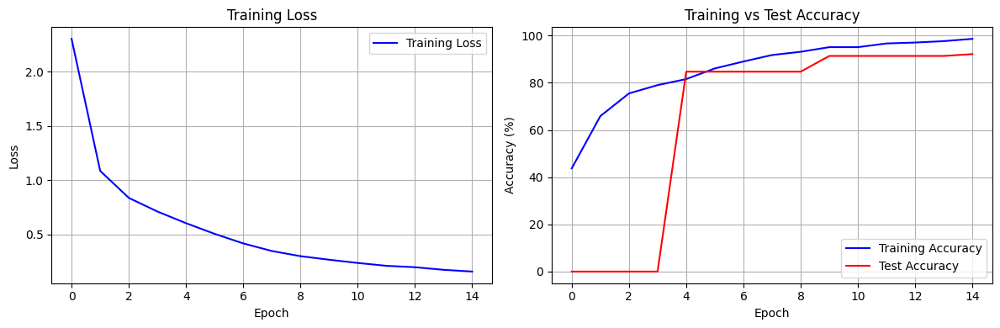

Noise Scale chosen : None


Evaluating: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]


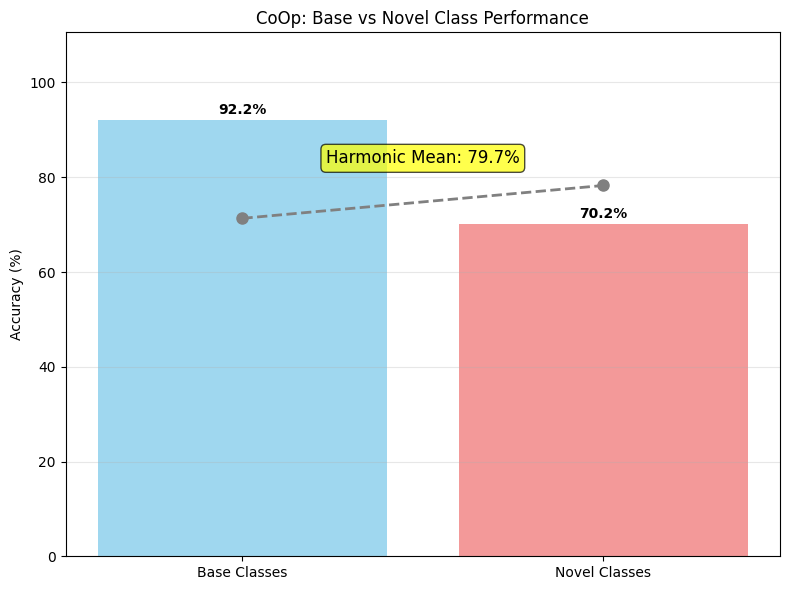

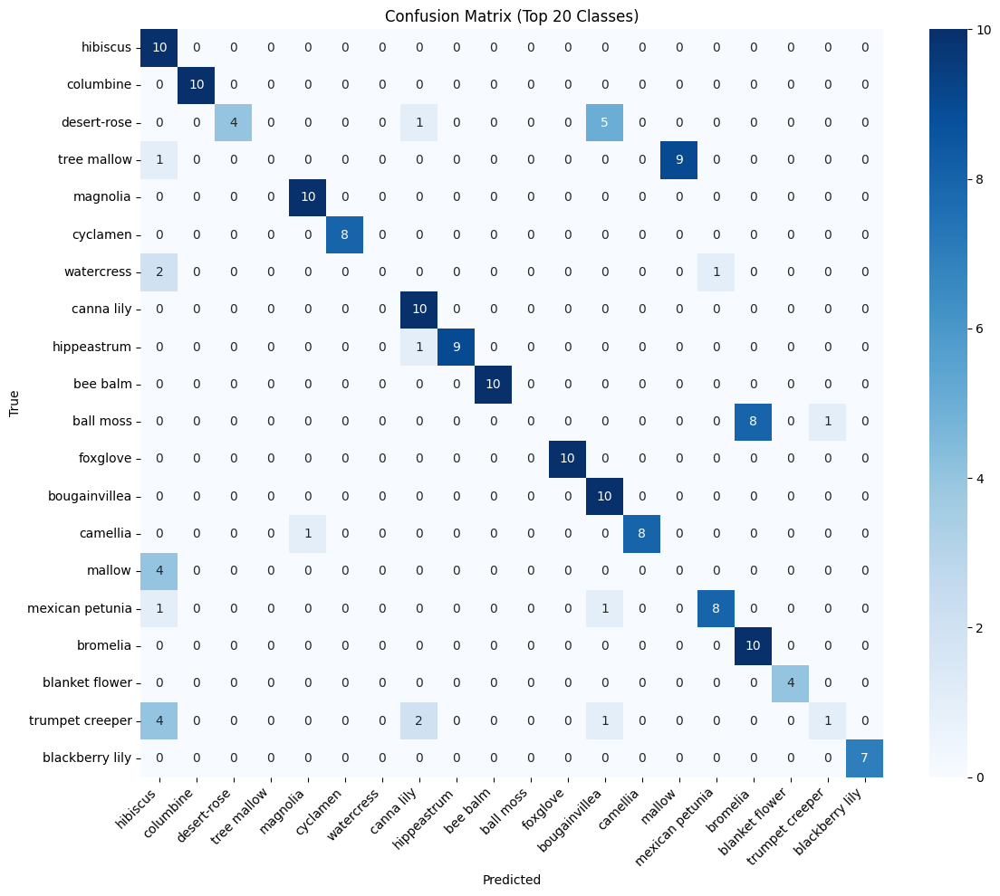

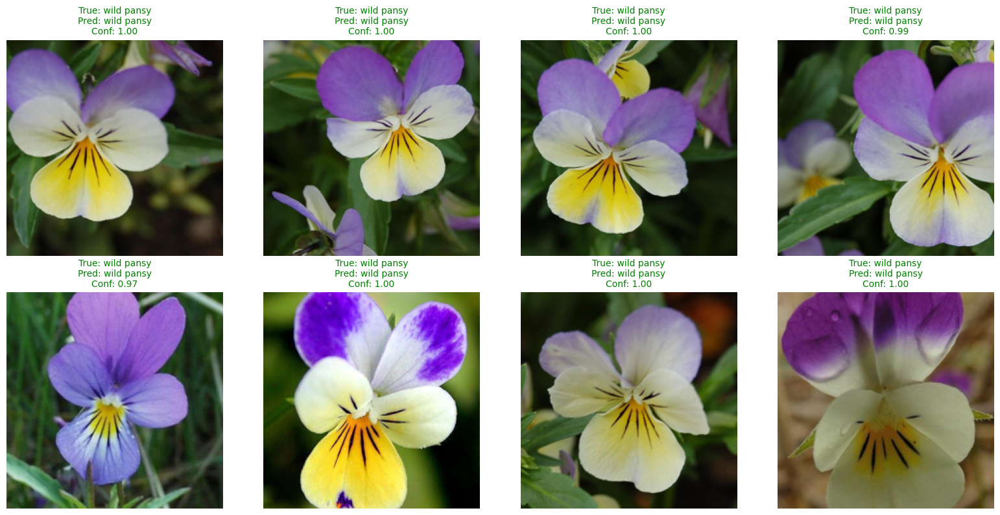

In [20]:
# CoOp
base_model, novel_model, base_acc, novel_acc, zero_shot_base_acc, zero_shot_novel_acc = main(model_type="coop", n_ctx=16, ctx_init="", num_epochs=15)
zero_shot_acc = [zero_shot_base_acc, zero_shot_novel_acc]

### 4.6 CoOp Enhancement : Adding Noise

To reduce overfitting in CoOp, we add Gaussian noise to the context vectors during training. For each context vector $c$, the noisy version $\tilde{c}$ is computed as:
$\tilde{c} = c + \epsilon, \quad \epsilon \sim \mathcal{N}(0, \sigma^2), \quad \sigma = \text{noise\_scale} \times \max(|c|)$

This regularization technique is inspired by classic methods we saw during the course such as dropout and data augmentation. Adding noise is also one the techniques we talked about when it comes to reduce overfitting for the NNs. It encourages the model to become less sensitive to specific context token representations. By slightly perturbing the inputs, the model is forced to learn more robust and transferable features, particularly useful in low-data or few-shot scenarios where models are prone to memorization.

- COOP Training on Oxford Flowers 102
Using device: cuda

- Loading CLIP model...

- Loading datasets...

- Dataset Analysis
Base classes: 51
Novel classes: 51

- Dataset sizes:
Train (base): 510
Val (base): 510, Val (novel): 510
Zero-Shot Base Accuracy: 71.33%
Zero-Shot Novel Accuracy: 78.26%

- Creating COOP model for base classes...
Initial context: "X X X X X X X X X X X X X X X X"
Number of context words: 16

- Starting COOP training...


Evaluating: 100%|██████████| 16/16 [00:04<00:00,  3.92it/s]



Epoch 5: Train Acc: 64.12%, Val (Base) Acc: 74.31%


Evaluating: 100%|██████████| 16/16 [00:04<00:00,  4.00it/s]



Epoch 10: Train Acc: 67.65%, Val (Base) Acc: 75.29%


Evaluating: 100%|██████████| 16/16 [00:04<00:00,  3.96it/s]



Epoch 15: Train Acc: 68.82%, Val (Base) Acc: 76.67%

- COOP training completed! Best validation accuracy: 76.67%

- Creating COOP model for novel class evaluation...
Initial context: "X X X X X X X X X X X X X X X X"
Number of context words: 16

- Evaluating on novel classes...


Evaluating: 100%|██████████| 16/16 [00:04<00:00,  3.44it/s]



- Final COOP Results:
Base Accuracy:  76.67%
Novel Accuracy: 78.63%
Harmonic Mean:  77.63%

- Generating visualizations...


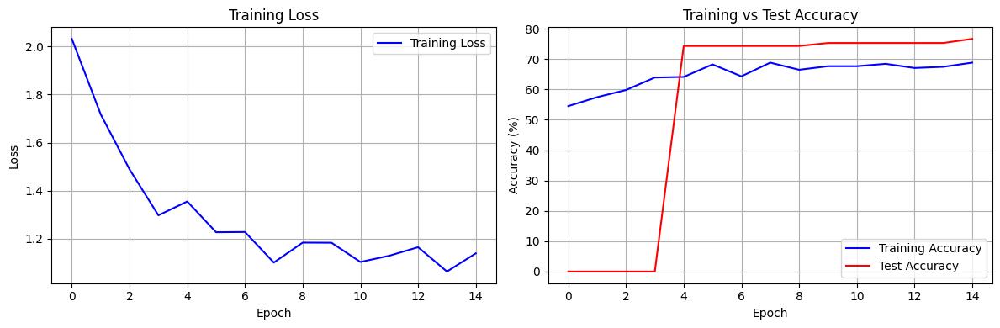

Noise Scale chosen : 0.125


Evaluating: 100%|██████████| 16/16 [00:03<00:00,  4.09it/s]


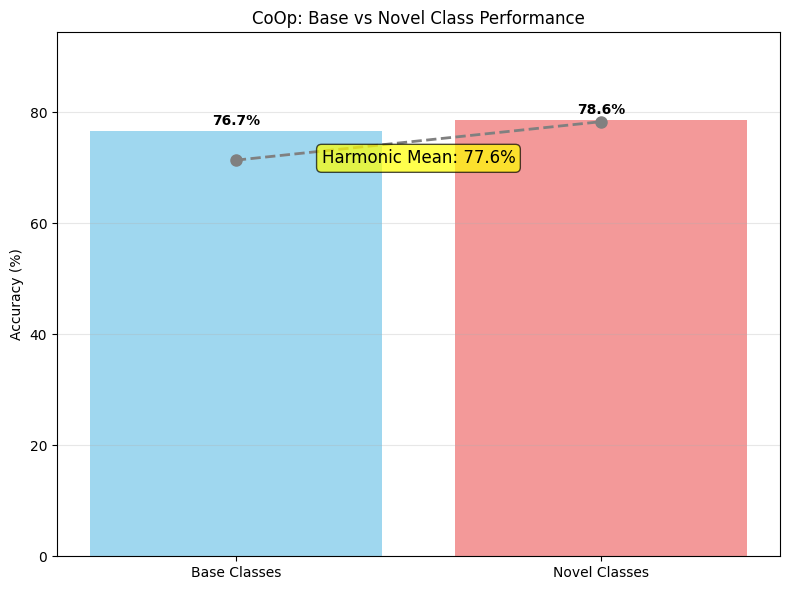

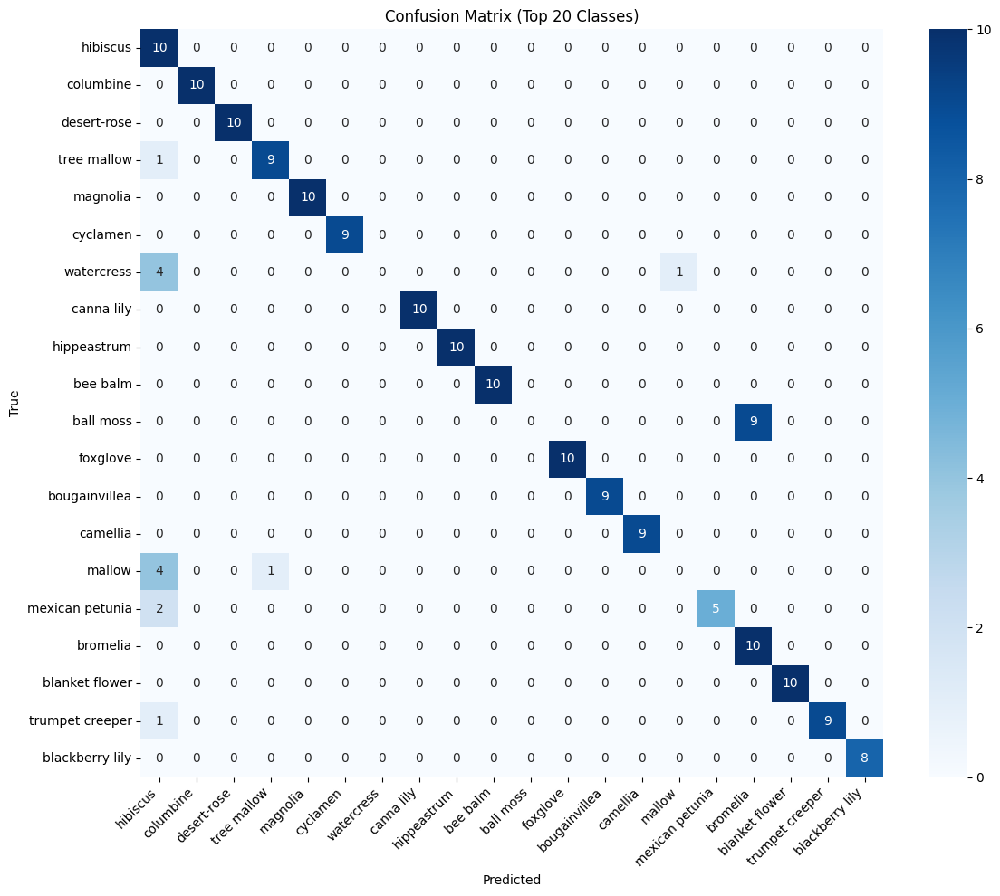

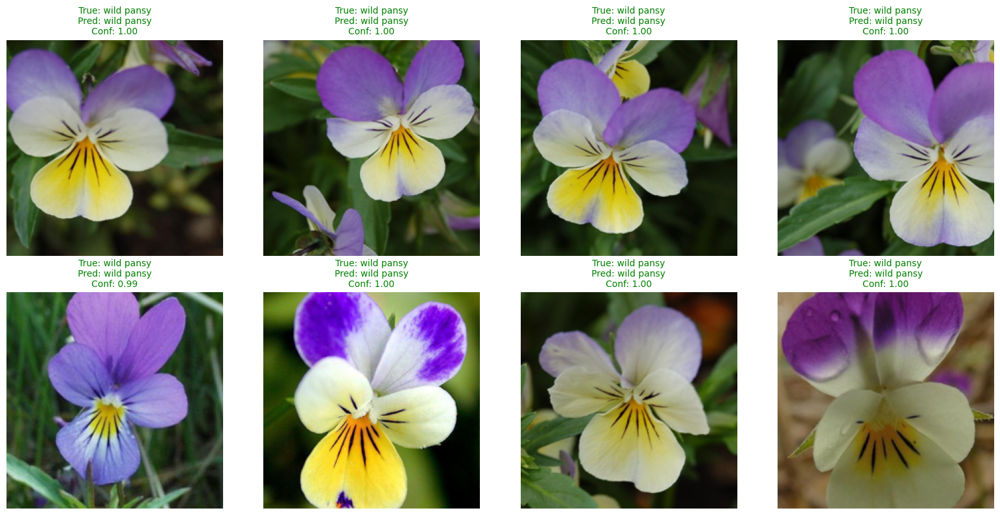

In [21]:
# CoOp
base_model, novel_model, base_acc, novel_acc, _, _ = main(model_type="coop", n_ctx=16, ctx_init="", num_epochs=15, noise_scale=0.125, zero_shot_acc=zero_shot_acc)

Adding noise to the context vectors during training appears to improve the model’s generalization to novel classes. While it slightly reduces the accuracy on base classes, it consistently helps preserve or enhance performance on novel classes. Overall, the harmonic mean between base and novel accuracy remains stable or improves slightly. This suggests that the noise acts as a regularizer, mitigating overfitting to base classes and encouraging the model to better adapt to unseen categories.

This should be interesting to keep in mind for the rest of this study.

---

## 5. CoCoOp Implementation

### 5.1 CoCoOp: Conditional Context Optimization Overview

**Motivation:** CoOp suffers from overfitting to base classes, leading to poor generalization to novel classes. CoCoOp addresses this limitation by making context vectors conditional on input images.

**Key Innovation:** Instead of using fixed learnable contexts, CoCoOp generates image-specific context modifications through a lightweight Meta-Network.

**Architecture:**
- **Base Context:** Learnable context vectors (same as CoOp)
- **Meta-Net:** Lightweight MLP that processes image features, hidden layer is reducing the input dimension by $16\times$ as for [1]
- **Conditional Context:** $P_m(x_i) = P_m + h_\phi(x_i)$
- **Benefits:** Better generalization while maintaining base class performance

**Expected Improvements:**
- Maintains base class accuracy improvements
- Preserves or improves novel class performance
- Higher harmonic mean than CoOp

### 5.1 CoCoOp Implementation

In [22]:
class CoCoOpPromptLearner(nn.Module):
    """CoCoOp: Conditional Context Optimization for Vision-Language Models"""
    def __init__(self, classnames, clip_model, n_ctx=16, ctx_init="", noise_scale=None):
        super().__init__()
        self.noise_scale = noise_scale
        n_cls = len(classnames)
        dtype = clip_model.dtype
        ctx_dim = clip_model.ln_final.weight.shape[0]
        vis_dim = clip_model.visual.output_dim

        # Initialize context vectors (same as CoOp)
        if ctx_init:
            ctx_init = ctx_init.replace("_", " ")
            n_ctx = len(ctx_init.split(" "))
            prompt = clip.tokenize(ctx_init).to(device)
            with torch.no_grad():
                embedding = clip_model.token_embedding(prompt).type(dtype)
            ctx_vectors = embedding[0, 1:1 + n_ctx, :]
            prompt_prefix = ctx_init
        else:
            ctx_vectors = torch.empty(n_ctx, ctx_dim, dtype=dtype)
            nn.init.normal_(ctx_vectors, std=0.02)
            prompt_prefix = " ".join(["X"] * n_ctx)

        print(f'Initial context: "{prompt_prefix}"')
        print(f"Number of context words: {n_ctx}")

        self.ctx = nn.Parameter(ctx_vectors)  # Base context vectors

        # Meta-network: generates image-conditional bias for context vectors
        if noise_scale:
            self.meta_net = nn.Sequential(OrderedDict([
                ("linear1", nn.Linear(vis_dim, vis_dim // 16)),
                ("bn1", nn.BatchNorm1d(vis_dim // 16)),
                ("relu", nn.ReLU(inplace=True)),
                ("dropout", nn.Dropout(p=0.3)),
                ("linear2", nn.Linear(vis_dim // 16, ctx_dim))
            ]))
        else:
            self.meta_net = nn.Sequential(OrderedDict([
                ("linear1", nn.Linear(vis_dim, vis_dim // 16)),
                ("relu", nn.ReLU(inplace=True)),
                ("linear2", nn.Linear(vis_dim // 16, ctx_dim))
            ]))

        # Prepare class names and prompts
        classnames = [name.replace("_", " ") for name in classnames]
        prompts = [prompt_prefix + " " + name + "." for name in classnames]

        tokenized_prompts = torch.cat([clip.tokenize(p).to(device) for p in prompts])
        with torch.no_grad():
            embedding = clip_model.token_embedding(tokenized_prompts).type(dtype)

        # Store token vectors (prefix and suffix)
        self.register_buffer("token_prefix", embedding[:, :1, :])  # SOS
        self.register_buffer("token_suffix", embedding[:, 1 + n_ctx:, :])  # CLS, EOS

        self.n_cls = n_cls
        self.n_ctx = n_ctx
        self.tokenized_prompts = tokenized_prompts
        self.classnames = classnames

    def construct_prompts(self, ctx, prefix, suffix):
        """Construct prompts by concatenating prefix, context, and suffix"""
        prompts = torch.cat([prefix, ctx, suffix], dim=1)
        return prompts

    def forward(self, im_features):
        """
        Generate image-conditional prompts

        Args:
            im_features: Image features from CLIP visual encoder [batch_size, vis_dim]

        Returns:
            prompts: Image-conditional prompts [batch_size, n_cls, n_tokens, ctx_dim]
        """
        prefix = self.token_prefix  # [n_cls, 1, ctx_dim]
        suffix = self.token_suffix  # [n_cls, ?, ctx_dim]

        ctx = self.ctx                     # [n_ctx, ctx_dim]
        bias = self.meta_net(im_features)  # [batch_size, ctx_dim]
        bias = bias.unsqueeze(1)           # [batch_size, 1, ctx_dim]
        ctx = ctx.unsqueeze(0)             # [1, n_ctx, ctx_dim]

        if self.training and self.noise_scale:
            # 1. Get the maximum value of the tokens
            max_val = ctx.abs().max().item()

            # 2. Noise scale based on the max value (noise_scale %)
            std = self.noise_scale * max_val

            # 3. Noise generation
            noise = torch.randn_like(ctx) * std

            # 4. Adding to the context
            ctx = ctx + noise

        ctx_shifted = ctx + bias           # [batch_size, n_ctx, ctx_dim]

        # Generate prompts for each image in the batch
        prompts = []
        for ctx_shifted_i in ctx_shifted:
            # Expand context for all classes
            ctx_i = ctx_shifted_i.unsqueeze(0).expand(self.n_cls, -1, -1)  # [n_cls, n_ctx, ctx_dim]
            pts_i = self.construct_prompts(ctx_i, prefix, suffix)  # [n_cls, n_tokens, ctx_dim]
            prompts.append(pts_i)
        prompts = torch.stack(prompts)  # [batch_size, n_cls, n_tokens, ctx_dim]

        return prompts

In [23]:
class CoCoOp(nn.Module):
    """Complete CoCoOp model"""
    def __init__(self, classnames, clip_model, n_ctx=4, ctx_init="", noise_scale=None):
        super().__init__()
        self.prompt_learner = CoCoOpPromptLearner(classnames, clip_model, n_ctx, ctx_init, noise_scale)
        self.tokenized_prompts = self.prompt_learner.tokenized_prompts
        self.image_encoder = clip_model.visual
        self.text_encoder = TextEncoder(clip_model)
        self.logit_scale = clip_model.logit_scale
        self.dtype = clip_model.dtype

    def forward(self, image):
        # Encode image
        image_features = self.image_encoder(image.type(self.dtype))
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)

        # Generate image-conditional prompts
        prompts = self.prompt_learner(image_features)  # [batch_size, n_cls, n_tokens, ctx_dim]

        logits = []
        for pts_i, imf_i in zip(prompts, image_features):
            # Encode text for each image's conditional prompts
            text_features = self.text_encoder(pts_i, self.tokenized_prompts)
            text_features = text_features / text_features.norm(dim=-1, keepdim=True)

            # Compute similarity
            logit_scale = self.logit_scale.exp()
            l_i = logit_scale * imf_i @ text_features.t()
            logits.append(l_i)

        logits = torch.stack(logits)
        return logits

### 5.3 Data Visualization
We now want to see the influence of our Meta-Net Neural Network so we can understand the metrics.

In [24]:
def plot_meta_network_analysis(model, test_loader, device, n_samples=100):
    """Visualize the meta-network's conditional context generation"""
    model.eval()

    # Collect image features and corresponding biases
    image_features_list = []
    biases_list = []
    labels_list = []

    with torch.no_grad():
        for i, (images, labels) in enumerate(test_loader):
            if len(image_features_list) >= n_samples:
                break

            images = images.to(device)

            # Get image features
            image_features = model.image_encoder(images.type(model.dtype))
            image_features = image_features / image_features.norm(dim=-1, keepdim=True)

            # Get meta-network bias
            bias = model.prompt_learner.meta_net(image_features)

            image_features_list.append(image_features.cpu().numpy())
            biases_list.append(bias.cpu().numpy())
            labels_list.extend(labels.numpy())

    # Concatenate all features
    all_image_features = np.concatenate(image_features_list, axis=0)[:n_samples]
    all_biases = np.concatenate(biases_list, axis=0)[:n_samples]
    all_labels = np.array(labels_list)[:n_samples]

    # Plot bias magnitude distribution
    bias_magnitudes = np.linalg.norm(all_biases, axis=1)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Plot 1: Bias magnitude distribution
    ax1.hist(bias_magnitudes, bins=30, alpha=0.7, color='purple')
    ax1.set_xlabel('Bias Magnitude')
    ax1.set_ylabel('Frequency')
    ax1.set_title('Distribution of Meta-Network Bias Magnitudes')
    ax1.grid(True, alpha=0.3)

    # Plot 2: Bias vs Image feature correlation (first few dimensions)
    ax2.scatter(all_image_features[:, 0], bias_magnitudes, alpha=0.6, c=all_labels, cmap='tab10')
    ax2.set_xlabel('First Image Feature Dimension')
    ax2.set_ylabel('Bias Magnitude')
    ax2.set_title('Image Features vs Meta-Network Bias')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"- Meta-Network Analysis:")
    print(f"   • Average bias magnitude: {bias_magnitudes.mean():.4f}")
    print(f"   • Bias magnitude std: {bias_magnitudes.std():.4f}")
    print(f"   • This shows how much the context varies based on input images")

### 5.4 Main Execution

We can therefore run the process and see how the different accuracies react.

- COCOOP Training on Oxford Flowers 102
Using device: cuda

- Loading CLIP model...

- Loading datasets...

- Dataset Analysis
Base classes: 51
Novel classes: 51

- Dataset sizes:
Train (base): 510
Val (base): 510, Val (novel): 510
Zero-Shot Base Accuracy: 71.33%
Zero-Shot Novel Accuracy: 78.26%

- Creating COCOOP model for base classes...
Initial context: "X X X X X X X X X X X X X X X X"
Number of context words: 16

- Starting COCOOP training...


Evaluating: 100%|██████████| 128/128 [01:03<00:00,  2.00it/s]



Epoch 5: Train Acc: 86.86%, Val (Base) Acc: 85.29%

- COCOOP training completed! Best validation accuracy: 85.29%

- Creating COCOOP model for novel class evaluation...
Initial context: "X X X X X X X X X X X X X X X X"
Number of context words: 16

- Evaluating on novel classes...


Evaluating: 100%|██████████| 128/128 [01:04<00:00,  1.99it/s]



- Final COCOOP Results:
Base Accuracy:  85.29%
Novel Accuracy: 77.45%
Harmonic Mean:  81.18%

- Generating visualizations...


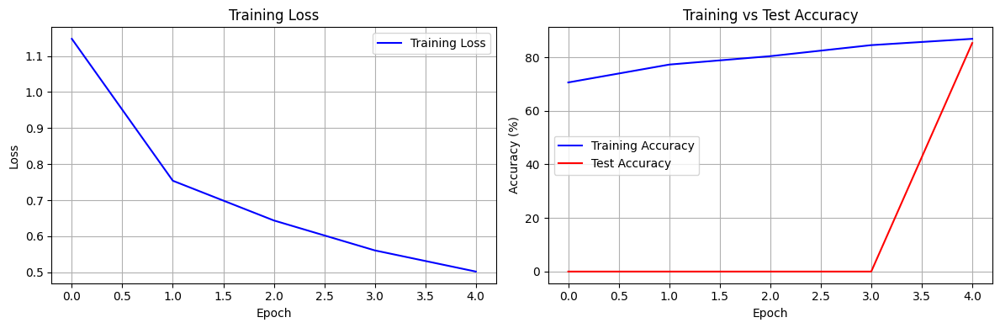

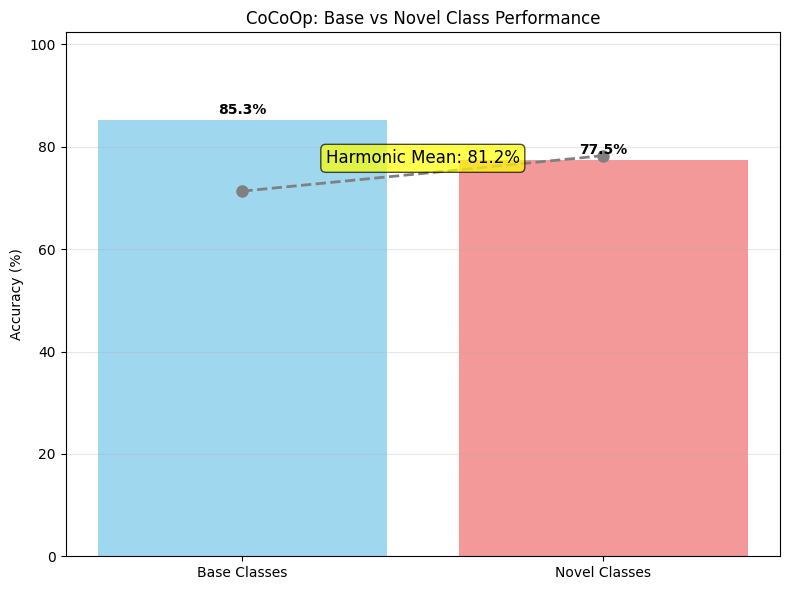

In [26]:
# CoCoOp
base_model, novel_model, base_acc, novel_acc, _, _ = main(model_type="cocoop", n_ctx=16, ctx_init="", num_epochs=5, batch_size=4, zero_shot_acc=zero_shot_acc)

The implementation of CoCoOp shows improvements in generalization compared to the original CoOp method. By conditioning the prompts on individual image features, CoCoOp adapts more effectively to unseen classes. Empirical results confirm that this approach leads to better performance on novel classes while maintaining competitive accuracy on base classes. However, we can still enhance it and this is what we will try to do next.

### 5.5 CoCoOp Enhancement : Better Generalization

To further improve the generalization ability of CoCoOp, we introduced minor modifications to its architecture. Specifically, the meta_net used to predict context vectors was enhanced by adding normalization and regularization components. The NN was modified as follows :

**Original:**
Input → Linear → ReLU → Linear → Output

**Enhanced:**
Input → Linear → BatchNorm → ReLU → Dropout → Linear → Output

This enhancement adds a Batch Normalization layer and a Dropout layer between the linear transformations. These components are useful for helping neural networks generalize better by stabilizing learning (**BatchNorm**) and reducing overfitting (**Dropout**). We also experimented with replacing **ReLU** by **LeakyReLU** as described in the course, but observed no significant change in performance.

In addition, we retained the idea of adding Gaussian noise to the context vectors during training beacuse this strategy had proven effective in improving CoOp's generalization. These architectural and training adjustments aim to improve robustness, particularly on novel classes, by encouraging the model to learn more generalizable context representations.

Finally, we also tried different NNs, but the results showed that the one we kept was better, here is a list of 3 NNs architectures we tried :


In [27]:
vis_dim = base_model.image_encoder.output_dim # Visual encoder output dimension
scale_dim = 512  # Dimension for intermediate layers
ctx_dim = base_model.prompt_learner.ctx.shape[1]  # Context dimension from CoCoOp

net_1 = nn.Sequential(
    nn.Linear(vis_dim, scale_dim),
    nn.LayerNorm(scale_dim),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(scale_dim, scale_dim // 2),
    nn.LayerNorm(scale_dim // 2),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(scale_dim // 2, ctx_dim),
    nn.Tanh()
)

net_2 = nn.Sequential(
    nn.Linear(vis_dim, scale_dim),
    nn.BatchNorm1d(scale_dim),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(scale_dim, ctx_dim)
)

net_3 = nn.Sequential(
    nn.Linear(vis_dim, scale_dim),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(scale_dim, ctx_dim)
)

- COCOOP Training on Oxford Flowers 102
Using device: cuda

- Loading CLIP model...

- Loading datasets...

- Dataset Analysis
Base classes: 51
Novel classes: 51

- Dataset sizes:
Train (base): 510
Val (base): 510, Val (novel): 510
Zero-Shot Base Accuracy: 71.33%
Zero-Shot Novel Accuracy: 78.26%

- Creating COCOOP model for base classes...
Initial context: "X X X X X X X X X X X X X X X X"
Number of context words: 16

- Starting COCOOP training...


Evaluating: 100%|██████████| 128/128 [01:03<00:00,  2.01it/s]



Epoch 5: Train Acc: 79.41%, Val (Base) Acc: 85.88%

- COCOOP training completed! Best validation accuracy: 85.88%

- Creating COCOOP model for novel class evaluation...
Initial context: "X X X X X X X X X X X X X X X X"
Number of context words: 16

- Evaluating on novel classes...


Evaluating: 100%|██████████| 128/128 [01:04<00:00,  1.99it/s]



- Final COCOOP Results:
Base Accuracy:  85.88%
Novel Accuracy: 76.86%
Harmonic Mean:  81.12%

- Generating visualizations...


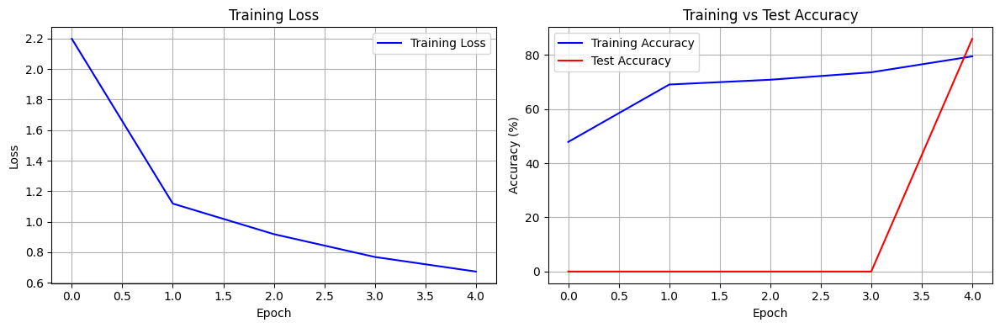

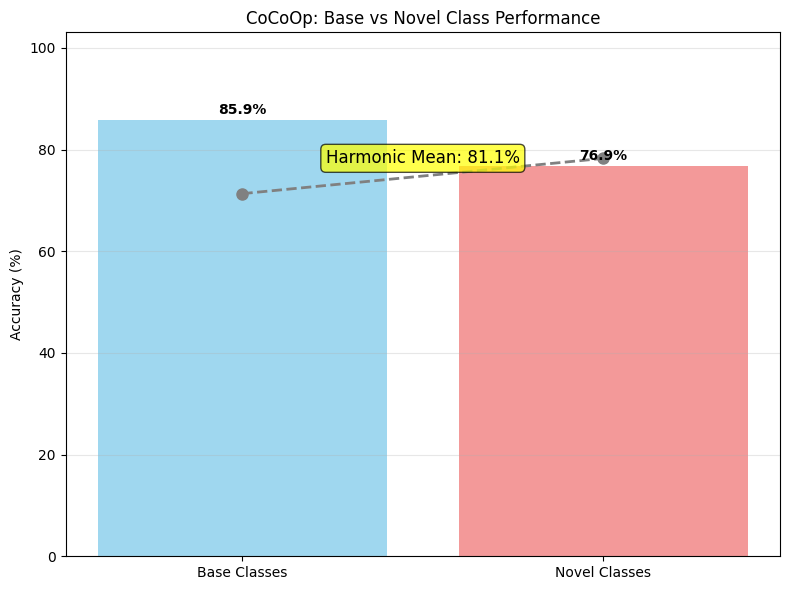

In [30]:
# CoCoOp
base_model, novel_model, base_acc, novel_acc, _, _ = main(model_type="cocoop", n_ctx=16, ctx_init="", num_epochs=5, batch_size=4, noise_scale=0.125, zero_shot_acc=zero_shot_acc)

In [31]:
%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

While these modifications appear to positively impact the model’s overall performance, especially in terms of generalization to novel classes, they also come along with a high training time because of the core of the CoCoOp method. As a result, we were unable to perform multiple training runs to fully validate the consistency of these improvements across different seeds or data splits.

---

## 6. CoCoOp Meta-Net Enhancement
### 6.1 Overview and Motivation
After training CoCoOp, we investigate whether input preprocessing enhancement can further improve the Meta-Net's ability to generate discriminative conditional tokens.\
**Research Question:** Can adaptive image enhancement techniques improve the clustering quality and discriminability of Meta-Net generated conditional tokens?

**Hypothesis:** Enhanced visual features could lead to:

- Better intra-class compactness (similar flowers cluster together)
- Improved inter-class separation (different flowers are more distinct)
- Higher clustering quality metrics (ARI, Silhouette Score, Purity)

### 6.2 Conditional Token Extraction Pipeline
Extract and analyze the conditional tokens generated by Meta-Net for different input images :
- **Image Preprocessing:** Apply optional adaptive enhancement
- **CLIP Encoding:** Extract visual features using frozen CLIP backbone
- **Meta-Net Processing:** Generate image-specific conditional tokens
- **Data Collection:** Store tokens, features, and metadata for analysis

In [66]:
@torch.no_grad()
def extract_conditional_tokens(meta_net, clip_model, dataset, device, batch_size=32,
                                       use_enhancement=True):
    """Extract conditional tokens with optional adaptive contrast enhancement"""

    print(f"Extracting conditional tokens {'with' if use_enhancement else 'without'} enhancement...")
    if use_enhancement:
        print(f"   - Enhancement method: transformation")

    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    all_conditional_tokens = []
    all_image_features = []
    all_labels = []
    all_indices = []

    clip_model.eval()
    meta_net.eval()

    current_idx = 0
    for images, labels in tqdm(dataloader, desc="Processing batches"):
        batch_size_actual = images.size(0)

        images = images.to(device)

        # Apply enhancement if requested
        if use_enhancement:
            images = apply_adaptive_contrast_enhancement(images)

        # Extract image features using CLIP
        image_features = clip_model.encode_image(images)
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        image_features = image_features.float()

        # Generate conditional tokens using Meta-Net
        conditional_tokens = meta_net(image_features)

        # Store results
        all_conditional_tokens.append(conditional_tokens.cpu())
        all_image_features.append(image_features.cpu())
        all_labels.extend(labels.tolist())
        all_indices.extend(list(range(current_idx, current_idx + batch_size_actual)))

        current_idx += batch_size_actual

    # Concatenate all results
    conditional_tokens = torch.cat(all_conditional_tokens, dim=0)
    image_features = torch.cat(all_image_features, dim=0)

    print(f"- Extracted {conditional_tokens.shape[0]} conditional tokens")
    print(f"- Token dimension: {conditional_tokens.shape[1]}")

    return {
        'conditional_tokens': conditional_tokens,
        'image_features': image_features,
        'labels': all_labels,
        'indices': all_indices,
        'num_samples': len(all_labels),
        'enhancement_used': use_enhancement
    }

### 6.3 Clustering Analysis
#### 6.3.1 Basic Clustering Metrics
Metrics Computed:
- **Adjusted Rand Index (ARI):** Measures clustering agreement with true labels (0-1, higher better)
- **Silhouette Score:** Evaluates cluster cohesion and separation (-1 to 1, higher better)
- **Cluster Purity:** Fraction of correctly clustered samples per cluster (0-1, higher better)

In [60]:
def analyze_token_clusters(token_data, class_names, n_clusters=None):
    """Analyze clustering patterns with basic metrics"""

    print("Analyzing token clustering patterns...")

    tokens = token_data['conditional_tokens'].numpy()
    true_labels = np.array(token_data['labels'])

    if n_clusters is None:
        n_clusters = len(np.unique(true_labels))

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(tokens)

    # Calculate basic clustering metrics
    ari_score = adjusted_rand_score(true_labels, cluster_labels)
    silhouette_avg = silhouette_score(tokens, cluster_labels)

    # Calculate advanced metrics
    advanced_metrics = calculate_advanced_clustering_metrics(token_data, class_names)

    print(f"- Basic Clustering Results:")
    print(f"      • Number of clusters: {n_clusters}")
    print(f"      • Adjusted Rand Index: {ari_score:.3f}")
    print(f"      • Silhouette Score: {silhouette_avg:.3f}")

    # Analyze cluster purity
    cluster_purity = []
    for cluster_id in range(n_clusters):
        cluster_mask = cluster_labels == cluster_id
        cluster_true_labels = true_labels[cluster_mask]

        if len(cluster_true_labels) > 0:
            most_common_label = np.bincount(cluster_true_labels).argmax()
            purity = np.sum(cluster_true_labels == most_common_label) / len(cluster_true_labels)
            cluster_purity.append(purity)

            #print(f"      • Cluster {cluster_id}: {len(cluster_true_labels)} samples, "
                  #f"purity {purity:.3f}, dominant class: {class_names[most_common_label]}")

    overall_purity = np.mean(cluster_purity)
    print(f"      • Overall Cluster Purity: {overall_purity:.3f}")

    return {
        'cluster_labels': cluster_labels,
        'ari_score': ari_score,
        'silhouette_score': silhouette_avg,
        'cluster_purity': overall_purity,
        'advanced_metrics': advanced_metrics
    }

#### 6.3.2 Advanced Discriminability Metrics
- **Intra-class Compactness:** Average distance within flower classes (lower = better clustering)
- **Inter-class Separation:** Distance between different flower centroids (higher = better separation)
- **Discriminability Ratio:** Separation/Compactness ratio (higher = more discriminative features)

In [61]:
def calculate_advanced_clustering_metrics(token_data, class_names):
    """Calculate advanced clustering metrics for better analysis"""
    print("Calculating advanced clustering metrics...")

    tokens = token_data['conditional_tokens'].numpy()
    labels = np.array(token_data['labels'])
    unique_labels = np.unique(labels)

    # 1. Intra-class compactness (lower is better)
    intra_class_distances = []
    class_compactness = {}

    for label in unique_labels:
        mask = labels == label
        class_tokens = tokens[mask]

        if len(class_tokens) > 1:
            class_distances = pairwise_distances(class_tokens, metric='euclidean')
            # Take upper triangular part (excluding diagonal)
            upper_tri_mask = np.triu(np.ones_like(class_distances, dtype=bool), k=1)
            class_intra_distances = class_distances[upper_tri_mask]

            mean_intra_dist = np.mean(class_intra_distances)
            intra_class_distances.extend(class_intra_distances)
            class_compactness[class_names[label]] = mean_intra_dist
        else:
            class_compactness[class_names[label]] = 0.0

    overall_intra_compactness = np.mean(intra_class_distances) if intra_class_distances else 0.0

    # 2. Inter-class separation (higher is better)
    inter_class_distances = []
    class_centroids = {}

    # Calculate class centroids
    for label in unique_labels:
        mask = labels == label
        centroid = np.mean(tokens[mask], axis=0)
        class_centroids[label] = centroid

    # Calculate distances between centroids
    centroid_labels = list(class_centroids.keys())
    for i in range(len(centroid_labels)):
        for j in range(i+1, len(centroid_labels)):
            label_i, label_j = centroid_labels[i], centroid_labels[j]
            dist = np.linalg.norm(class_centroids[label_i] - class_centroids[label_j])
            inter_class_distances.append(dist)

    overall_inter_separation = np.mean(inter_class_distances) if inter_class_distances else 0.0
    min_inter_separation = np.min(inter_class_distances) if inter_class_distances else 0.0

    # 3. Feature discriminability ratio (higher is better)
    discriminability_ratio = overall_inter_separation / (overall_intra_compactness + 1e-8)

    # 4. Silhouette analysis per class
    silhouette_scores = silhouette_samples(tokens, labels)
    class_silhouette = {}

    for label in unique_labels:
        mask = labels == label
        class_silhouette[class_names[label]] = np.mean(silhouette_scores[mask])

    print(f"-  Advanced Clustering Metrics:")
    print(f"      • Intra-class Compactness: {overall_intra_compactness:.4f}")
    print(f"      • Inter-class Separation: {overall_inter_separation:.4f}")
    print(f"      • Min Inter-class Distance: {min_inter_separation:.4f}")
    print(f"      • Discriminability Ratio: {discriminability_ratio:.4f}")

    return {
        'intra_class_compactness': overall_intra_compactness,
        'inter_class_separation': overall_inter_separation,
        'min_inter_separation': min_inter_separation,
        'discriminability_ratio': discriminability_ratio,
        'class_compactness': class_compactness,
        'class_silhouette': class_silhouette
    }

### 6.4 Visual Analysis and Dimensionality Reduction
The analysis goal is to visualize how well different flower classes separate in the conditional token space. We are achieving this using the UMAP method that seems to be the best in order to maintains both local and global structure as stated in this paper : [UMAP: Uniform Manifold Approximation and Projection for Dimension Reduction](https://arxiv.org/pdf/1802.03426) .\
Expected Patterns:
- Good Clustering: Distinct flower types form separate, compact clusters
- Poor Clustering: Overlapping or scattered representations across species

In [62]:
def visualize_token_space(token_data, max_samples_per_class=5):
    """Visualize conditional tokens using dimensionality reduction with umap"""

    print(f"Visualizing token space using UMAP...")

    # Prepare data
    tokens = token_data['conditional_tokens'].numpy()
    labels = np.array(token_data['labels'])

    # Sample data for better visualization if needed
    if max_samples_per_class:
        sampled_indices = []
        unique_labels = np.unique(labels)

        for label in unique_labels:
            label_indices = np.where(labels == label)[0]
            if len(label_indices) > max_samples_per_class:
                sampled = np.random.choice(label_indices, max_samples_per_class, replace=False)
                sampled_indices.extend(sampled)
            else:
                sampled_indices.extend(label_indices)

        sampled_indices = np.array(sampled_indices)
        tokens = tokens[sampled_indices]
        labels = labels[sampled_indices]

        print(f"- Sampled {len(tokens)} tokens for visualization")

    # Apply dimensionality reduction
    reducer = umap.UMAP(n_components=2, random_state=42)

    print(f"- Applying UMAP reduction...")
    reduced_tokens = reducer.fit_transform(tokens)

    # Create visualization
    plt.figure(figsize=(12, 8))

    # Create color map
    unique_labels = np.unique(labels)
    colors = plt.cm.tab20(np.linspace(0, 1, len(unique_labels)))

    for i, label in enumerate(unique_labels):
        mask = labels == label
        plt.scatter(reduced_tokens[mask, 0], reduced_tokens[mask, 1],
                    c=[colors[i]], label=CLASS_NAMES[label], alpha=0.7, s=30)

    plt.xlabel(f'UMAP Component 1')
    plt.ylabel(f'UMAP Component 2')
    plt.show()

    return reduced_tokens

### 6.5 Adaptive Contrast Enhancement Implementation
The strategy we use consists of saturation boosting and is mainly biologically motivated: flowers are distinguished primarily by color patterns, so enhanced saturation should improve discriminability.

In [63]:
def apply_adaptive_contrast_enhancement(image_tensor):
    """Apply adaptive contrast enhancement to improve feature discriminability"""

    is_batch = len(image_tensor.shape) == 4
    if not is_batch:
        image_tensor = image_tensor.unsqueeze(0)

    enhanced_batch = []

    for img in image_tensor:
        # Convert from tensor (C,H,W) to numpy (H,W,C) and denormalize
        img_np = img.permute(1, 2, 0).cpu().numpy()
        img_np = ((img_np * 0.5 + 0.5) * 255).astype(np.uint8)  # Denormalize from [-1,1] to [0,255]

        enhanced_img = _apply_transformation(img_np)

        # Convert back to tensor format and normalize
        enhanced_img = enhanced_img.astype(np.float32) / 255.0
        enhanced_img = (enhanced_img - 0.5) / 0.5  # Normalize to [-1,1]
        enhanced_tensor = torch.from_numpy(enhanced_img).permute(2, 0, 1)
        enhanced_batch.append(enhanced_tensor)

    enhanced_batch = torch.stack(enhanced_batch).to(image_tensor.device)

    if not is_batch:
        enhanced_batch = enhanced_batch.squeeze(0)

    return enhanced_batch

def _apply_transformation(img_np, factor=1.2):
    img_hsv = cv2.cvtColor(img_np, cv2.COLOR_RGB2HSV).astype(np.float32)
    img_hsv[...,1] = np.clip(img_hsv[...,1] * factor, 0, 255)
    img_boosted = cv2.cvtColor(img_hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)
    return img_boosted

### 6.6 Overall Implementation Pipeline
The Analysis Workflow is coded as follows:
- Load Models
- Prepare the Dataset
- Process the Images
- Run Comparative Analysis
- Visualize the Results
- Summarize the Statistics

A controlled setup is used: both baseline and enhanced conditions are evaluated with the exact same models and dataset, ensuring a fair and consistent comparison.

In [67]:
def analyze_meta_net_tokens_enhanced(dataset_type="train", batch_size=32):
    """Complete pipeline for enhanced Meta-Net token analysis with comparison"""

    print("=" * 80)
    print("Meta-Net Tokens Visualization and Analysis")
    print("=" * 80)

    # Load Meta-Net
    print("\n1. Loading Meta-Net...")
    meta_net = copy.deepcopy(base_model.prompt_learner.meta_net)

    # Load CLIP model
    print("\n2. Loading CLIP model...")
    clip_model, preprocess = clip.load("ViT-B/16", device=device)
    clip_model.float()
    print("- CLIP ViT-B/16 loaded successfully")

    # Load dataset (same logic as original)
    print(f"\n3. Loading {dataset_type} dataset...")
    train_set, val_set, test_set = get_data(transform=preprocess)
    base_classes, novel_classes = base_novel_categories(train_set)

    if dataset_type == "train":
        dataset, _ = split_data(train_set, base_classes)
        class_names = [CLASS_NAMES[c] for c in base_classes]
    elif dataset_type == "val":
        dataset, _ = split_data(val_set, base_classes)
        class_names = [CLASS_NAMES[c] for c in base_classes]
    elif dataset_type == "test_base":
        dataset, _ = split_data(test_set, base_classes)
        class_names = [CLASS_NAMES[c] for c in base_classes]
    elif dataset_type == "test_novel":
        _, dataset = split_data(test_set, base_classes)
        class_names = [CLASS_NAMES[c] for c in novel_classes]
    else:
        raise ValueError("dataset_type must be one of: 'train', 'val', 'test_base', 'test_novel'")

    print(f"- Dataset loaded: {len(dataset)} samples")
    print(f"- Classes: {len(class_names)}")

    results = {}

    # Baseline analysis (no enhancement)
    print("\n4. Baseline Analysis (No Enhancement)...")
    baseline_tokens = extract_conditional_tokens(
        meta_net, model, dataset, device, batch_size,
        use_enhancement=False
    )
    baseline_clusters = analyze_token_clusters(baseline_tokens, class_names)
    results['baseline'] = {
        'token_data': baseline_tokens,
        'cluster_results': baseline_clusters
    }

    # 2D visualization
    reduced_2d = visualize_token_space(baseline_tokens)

    print(f"\n5. Enhanced Analysis...")
    enhanced_tokens = extract_conditional_tokens(
        meta_net, model, dataset, device, batch_size,
        use_enhancement=True
    )
    enhanced_clusters = analyze_token_clusters(enhanced_tokens, class_names)
    results['enhanced_method'] = {
        'token_data': enhanced_tokens,
        'cluster_results': enhanced_clusters
    }

    # 2D visualization
    reduced_2d = visualize_token_space(enhanced_tokens)

    # Comparative summary
    print("\n" + "=" * 80)
    print("Comparative Analysis Summary")
    print("=" * 80)

    summary_table = []
    for key, result in results.items():
        metrics = result['cluster_results']
        adv_metrics = metrics['advanced_metrics']

        summary_table.append({
            'Method': key,
            'ARI': f"{metrics['ari_score']:.3f}",
            'Silhouette': f"{metrics['silhouette_score']:.3f}",
            'Purity': f"{metrics['cluster_purity']:.3f}",
            'Discriminability': f"{adv_metrics['discriminability_ratio']:.3f}",
            'Compactness': f"{adv_metrics['intra_class_compactness']:.3f}",
            'Separation': f"{adv_metrics['inter_class_separation']:.3f}"
        })

    print(f"{'Method':<15} {'ARI':<6} {'Sil':<6} {'Pur':<6} {'Disc':<6} {'Comp':<6} {'Sep':<6}")
    print("-" * 60)
    for row in summary_table:
        print(f"{row['Method']:<15} {row['ARI']:<6} {row['Silhouette']:<6} {row['Purity']:<6} "
              f"{row['Discriminability']:<6} {row['Compactness']:<6} {row['Separation']:<6}")

    print("=" * 80)

    return results

### 6.7 Results Analysis and Conclusions

Meta-Net Tokens Visualization and Analysis

1. Loading Meta-Net...

2. Loading CLIP model...
- CLIP ViT-B/16 loaded successfully

3. Loading train dataset...
- Dataset loaded: 510 samples
- Classes: 51

4. Baseline Analysis (No Enhancement)...
Extracting conditional tokens without enhancement...


Processing batches: 100%|██████████| 16/16 [00:03<00:00,  4.14it/s]


- Extracted 510 conditional tokens
- Token dimension: 512
Analyzing token clustering patterns...
Calculating advanced clustering metrics...
-  Advanced Clustering Metrics:
      • Intra-class Compactness: 6.0265
      • Inter-class Separation: 9.3443
      • Min Inter-class Distance: 3.0327
      • Discriminability Ratio: 1.5505
- Basic Clustering Results:
      • Number of clusters: 51
      • Adjusted Rand Index: 0.446
      • Silhouette Score: 0.161
      • Overall Cluster Purity: 0.673
Visualizing token space using UMAP...
- Sampled 255 tokens for visualization
- Applying UMAP reduction...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


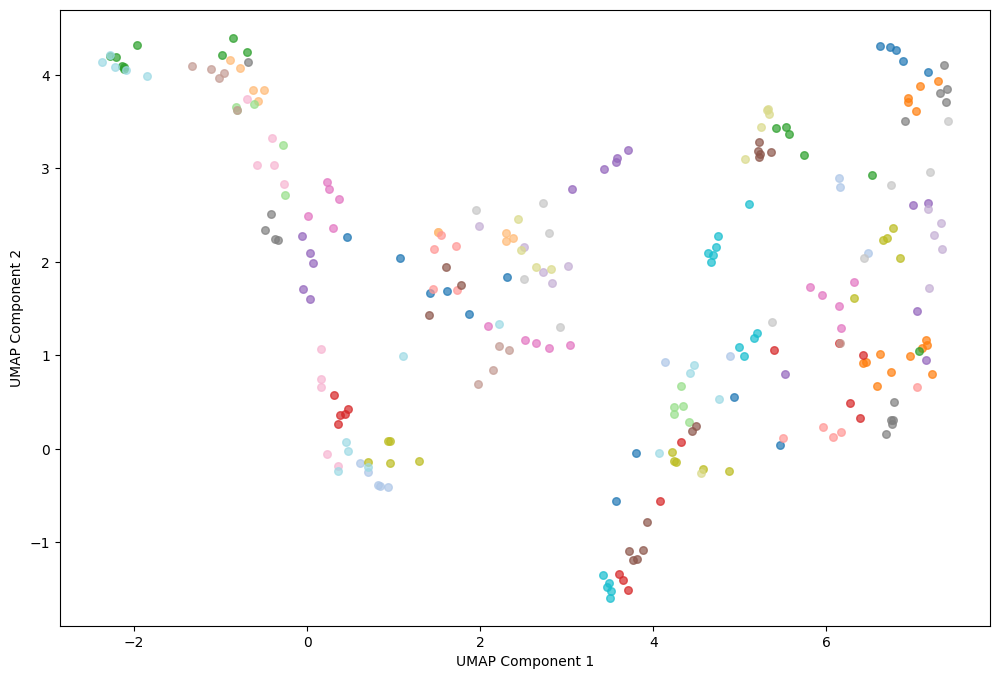


5. Enhanced Analysis...
Extracting conditional tokens with enhancement...
   - Enhancement method: transformation


Processing batches: 100%|██████████| 16/16 [00:05<00:00,  2.71it/s]


- Extracted 510 conditional tokens
- Token dimension: 512
Analyzing token clustering patterns...
Calculating advanced clustering metrics...
-  Advanced Clustering Metrics:
      • Intra-class Compactness: 4.2585
      • Inter-class Separation: 4.0232
      • Min Inter-class Distance: 1.2083
      • Discriminability Ratio: 0.9448
- Basic Clustering Results:
      • Number of clusters: 51
      • Adjusted Rand Index: 0.107
      • Silhouette Score: 0.093
      • Overall Cluster Purity: 0.381
Visualizing token space using UMAP...
- Sampled 255 tokens for visualization
- Applying UMAP reduction...


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


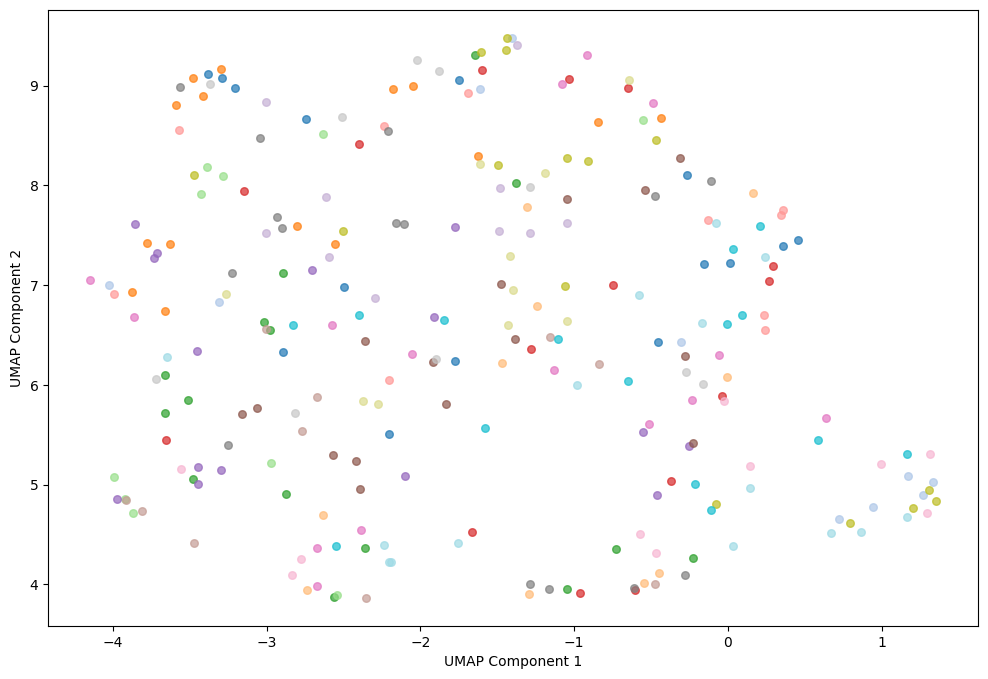


Comparative Analysis Summary
Method          ARI    Sil    Pur    Disc   Comp   Sep   
------------------------------------------------------------
baseline        0.446  0.161  0.673  1.551  6.027  9.344 
enhanced_method 0.107  0.093  0.381  0.945  4.258  4.023 


In [68]:
# Visualize and analyze Meta-Net tokens with enhancement
comparison_results = analyze_meta_net_tokens_enhanced(dataset_type="train")

#### 6.7.1 Impact of Enhancement on Clustering Quality

The results showed that applying adaptive contrast enhancement did not improve clustering performance. In fact, almost all evaluated metrics decreased after enhancement. The discriminability ratio also dropped, indicating reduced feature separability.

Visualization using UMAP revealed more overlapping clusters and blurred class boundaries for enhanced images. Additionally, intra-class variance increased, meaning individual flower classes were less compact and more scattered.

#### 6.7.2 Reasons of Poor Performances

The decrease in performance might be explained by three key factors:

- **CLIP’s Robustness to Noise:**
    CLIP is trained on massive and diverse datasets and is designed to be robust to a variety of image conditions. Because of this, simple enhancements like contrast boosting can introduce unnatural artifacts that deviate from CLIP’s expected input, hurting rather than helping.

- **Domain Shift from Enhancement:**
    Adaptive contrast enhancement unintentionally created a distribution mismatch. The model was trained on naturally occurring images, and the enhanced images introduced a domain gap, reducing the reliability of extracted features.

- **Meta-Net’s Optimization Context:**
    The Meta-Net model was trained specifically with standard CLIP features. At test time, feeding it enhanced features created a train-test mismatch, undermining performance.

#### 6.7.3 Methodological Takeaways

This experiment highlights a few important insights:

- Pre-trained models like CLIP are already highly optimized for extracting robust features, reducing the need for additional preprocessing.

- Post-hoc image enhancement may not benefit downstream tasks and can even be detrimental unless carefully aligned with model expectations.

For future work, feature enhancement techniques should be applied before foundation model training, not after. Furthermore, effective domain adaptation will likely require more sophisticated methods than basic image preprocessing.

---

## 7. Conclusion and Future Work

Another direction we propose involves modifying the training strategy by integrating fine-tuning of the meta-network throughout the entire training process, rather than restricting it to a post-hoc phase. The central idea is to incorporate the **NT-Xent Loss**, a contrastive loss function introduced in [SimCLR (Chen et al., 2020)](https://arxiv.org/abs/2002.05709), which has demonstrated strong effectiveness in shaping meaningful and discriminative embedding spaces in self-supervised learning.
The SimCLR is a strategy that trains model weights by training on the task of identifying the two images that are augmented views of each other out of a batch of other random images. We wanted to use this concept on the **pair image-text** and apply it to our pipeline.

Instead of relying solely on the original task-specific loss, we propose augmenting it with a contrastive component that encourages the model to bring together representations of similar instances (positive pairs) while pushing apart those of dissimilar ones (negative pairs). This is achieved by adding a weighted NT-Xent loss term to the total objective:

$\mathcal{L}_{\text{total}} = \mathcal{L}_{\text{task}} + \lambda \cdot \mathcal{L}_{\text{contrastive}}$

This formulation allows us to preserve the original task objective while guiding the model toward a more structured latent space. Although we have not yet implemented this approach, the intention would be to assess whether this combined loss can improve feature clustering quality without compromising performance on the meta-learning objective. Unfortunately, we did not have the time to implement this method but we think that it would be a really good thing to do.